In [1]:
import dask.dataframe as dd
from dask.distributed import Client
import pandas as pd
from pathlib import Path
from rdkit import Chem, RDLogger
from rdkit.Chem.MolStandardize import rdMolStandardize
from rdkit.Chem import Draw
import datamol as dm
import json
import re
from functools import partial
import numpy as np

In [2]:
json.loads(Path("db.json").read_text())

{'001': 'Enamine_REAL_65B_parquet/*.parquet',
 '002': 'ZINC22_parquet/*.parquet',
 '003': 'Savi_parquet/*.parquet',
 '004': 'PubChem_parquet/*.parquet',
 '005': 'ChEMBL_parquet/*.parquet',
 '006': 'MCule_parquet/*.parquet',
 '007': 'Coconut_parquet/*.parquet',
 '008': 'NPAtlas_parquet/*.parquet',
 '009': 'ChemistriX_parquet/*.parquet',
 '010': 'CHIPMUNK_parquet/*.parquet',
 '011': 'SCUBIDOO_parquet/*.parquet',
 '012': 'SureChEMBL_parquet/*.parquet',
 '013': 'MolPort_parquet/*.parquet'}

In [2]:
file = list(Path("../../pubchem").glob("*.csv"))
file

[PosixPath('../../pubchem/Compound_000000001_000500000_clean.csv'),
 PosixPath('../../pubchem/Compound_000500001_001000000_clean.csv')]

In [15]:
client = Client(n_workers=4)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 31.08 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43655,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:43669,Total threads: 2
Dashboard: http://127.0.0.1:44691/status,Memory: 7.77 GiB
Nanny: tcp://127.0.0.1:42091,


## Canonize and sanitize the smiles

In [ ]:
ddf = dd.read_csv(file[0])
len(ddf)

444154

In [ ]:
df = pd.read_csv(r"../../ChEMBL_09122024_clean.csv")
df = df.dropna(subset=["SMILES"])

In [22]:
ask = dd.read_parquet("test_files/part.0.parquet")
ask.head()

,ID,SMILES,num_ID
0,1,CN(Cc1ccco1)C(=O)c2ccon2,0
1,2,CN(Cc1ccon1)C(=O)c2ccon2,1
2,3,C[C@H](c1ccon1)N(C)C(=O)c2ccon2,2
3,4,C[C@@H](c1ccon1)N(C)C(=O)c2ccon2,3
4,5,c1cnoc1CNC(=O)c2ccon2,4


In [16]:
u

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


## Clean all files

In [18]:
PEPTIDE_SMARTS = "[NX3:1][CX3:2](=[OX1:20])[CX4:4][NX3:5][CX3:6](=[OX1:60])[CX4:7][NX3:8][CX3:9](=[OX1:90])[CX4:10]" # dipeptide motif
Q = Chem.MolFromSmarts(PEPTIDE_SMARTS)
unsatu = Chem.MolFromSmarts('[CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0]')

tokenizer = re.compile(
        r'(\[[^\]]+\]|Br?|Cl?|N|O|S|P|F|I|B|C|b|c|n|o|s|p|\(|\)|\.|\=|\#|\-|\+|\\\\|\/|\:|\~|\@|\?|>>?|\*|\$|\%[0-9]{2}|[0-9])'
    )

halogen = re.compile(r'Br|Cl|F|I')
glycol = Chem.MolFromSmarts('CCOCCOCCO')

rare = {
    'He', 'Li', 'Be', 'Ne',
    'Na', 'Mg', 'Al', 'Ar', 'K', 'Ca',
    'Sc', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn',
    'Ga', 'Ge', 'As', 'Se', 'Kr', 'Rb', 'Sr', 'Y', 'Zr',
    'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn',
    'Sb', 'Te', 'Xe', 'Cs', 'Ba', 'La', 'Ce', 'Pr', 'Nd',
    'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb',
    'Lu', 'Hf', 'Ta', 'W', 'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg',
    'Tl', 'Pb', 'Bi', 'Po', 'At', 'Rn', 'Fr', 'Ra', 'Ac', 'Th',
    'Pa', 'U', 'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm',
    'Md', 'No', 'Lr', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds',
    'Rg', 'Cn', 'Fl', 'Lv', 'Ts', 'Og'}


def _amide_cn_bond_not_ring(mol, a_idx, c_idx):
    b = mol.GetBondBetweenAtoms(a_idx, c_idx)
    return (b is not None) and (not b.IsInRing())

def _has_nonring_carbon_on_nonamide_side(mol, carbonyl_c_idx, amide_n_idx):
    """
    Require an external, NON-RING carbon neighbor on the non-amide side of the carbonyl carbon.
    (Prevents attachment directly to aromatic/ring carbon like ...C(=O)c1...)
    """
    c = mol.GetAtomWithIdx(carbonyl_c_idx)
    for nb in c.GetNeighbors():
        nb_idx = nb.GetIdx()
        if nb_idx == amide_n_idx:
            continue
        b = mol.GetBondBetweenAtoms(carbonyl_c_idx, nb_idx)
        if b is None:
            continue
        # skip the carbonyl oxygen
        if nb.GetAtomicNum() == 8 and b.GetBondType() == Chem.BondType.DOUBLE:
            continue
        # must be carbon, not in a ring, and the bond itself not a ring bond
        if nb.GetAtomicNum() == 6 and (not nb.IsInRing()) and (not b.IsInRing()):
            return True
    return False


def is_true_peptide(mol: Chem.Mol) -> bool:
    """
    True if the molecule contains two consecutive peptide (amide) bonds where:
      - the motif NX3-C(=O)-CX4-NX3-C(=O) is present,
      - NONE of the matched atoms are in a ring,
      - each amide C-N bond is NOT a ring bond,
      - and each carbonyl carbon is 'internal' to a NON-RING carbon on its non-amide side
        (so ...C(=O)c... is rejected).
    """

    for match in mol.GetSubstructMatches(Q):
        # Build map#:target_idx dictionary from the query order
        mapnum_to_idx = {}
        for q_atom, tgt_idx in zip(Q.GetAtoms(), match):
            amap = q_atom.GetAtomMapNum()
            if amap:
                mapnum_to_idx[amap] = tgt_idx

        n1 = mapnum_to_idx[1]
        c1 = mapnum_to_idx[2]
        ca1 = mapnum_to_idx[3]
        n2 = mapnum_to_idx[4]
        c2 = mapnum_to_idx[5]
        ca2 = mapnum_to_idx[6]
        n3 = mapnum_to_idx[7]
        c3 = mapnum_to_idx[8]
        # oxygens are 20,21 if you need them: o1 = mapnum_to_idx[20]; o2 = mapnum_to_idx[21]

        # 1) all matched atoms (including oxygens) must be non-ring
        if any(mol.GetAtomWithIdx(idx).IsInRing() for idx in match):
            continue

        # 2) both amide C-N bonds must not be ring bonds
        if not (_amide_cn_bond_not_ring(mol, n1, c1) and 
                _amide_cn_bond_not_ring(mol, n2, c2) and 
                _amide_cn_bond_not_ring(mol, n3, c3)):
            
            continue

        # 3) require a NON-RING carbon neighbor on the non-amide side of each carbonyl carbon
        if not (_has_nonring_carbon_on_nonamide_side(mol, c1, n1) and
                _has_nonring_carbon_on_nonamide_side(mol, c2, n2) and 
                _has_nonring_carbon_on_nonamide_side(mol, c3, n3)):
            continue

        return True

    return False


def preprocess_smiles(smi: str, check_isotopes: bool = False) -> str | None:
    """Normalize SMILES by:
    - Converting to canonical isomeric SMILES
    - Removing salts (keeping largest fragment)
    - Neutralizing charges
    
    Parameters
    ----------
    smi : str
        Input SMILES string
        
    Returns
    ------- 
    str | None
        Normalized canonical SMILES or None if invalid
    """ 
    print(check_isotopes)
    if not smi:
        return None
    
    try:
        with dm.without_rdkit_log():
            mol = dm.to_mol(smi, ordered=True)
            if mol is None:
                return None
            if check_isotopes and any(atom.GetIsotope() != 0 for atom in mol.GetAtoms()):
                return None
            mol = dm.fix_mol(mol, largest_only=True if "." in smi else False)
            
            mol = dm.standardize_mol(
            mol,
            disconnect_metals=False,
            normalize=True,
            reionize=True if "+" in smi or "-" in smi else False,
            uncharge=False,
            stereo=False,
            )
            
            # filtrado por moleculas que contienen isotopos o metales
            if is_true_peptide(mol): # skip true peptides
                return None
            #poli ethylene glycol
            if mol.HasSubstructMatch(glycol):
                return None
            if mol.HasSubstructMatch(unsatu):
                return None

            sma = Chem.MolToSmiles(mol, canonical=True, isomericSmiles=True)
            
            tokens = tokenizer.findall(sma)
            
            for atom in tokens:
                if atom.strip("[]") in rare:
                    return None
                
            if len(halogen.findall(sma)) >= 6:
                return None
                                  
        return sma
    
    except Exception:
        return None

[16:30:47] Initializing Normalizer
[16:30:47] Running Normalizer


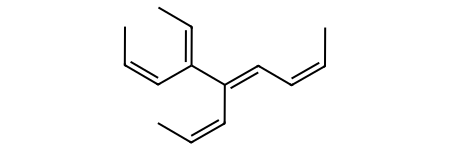

In [24]:
smi = r"C/C=C\C=C(/C=C\C)C(/C=C\C)=C/C"
mol = Chem.MolFromSmiles(smi, sanitize=True)
mol = rdMolStandardize.Normalize(mol)
Chem.SanitizeMol(mol)
mol

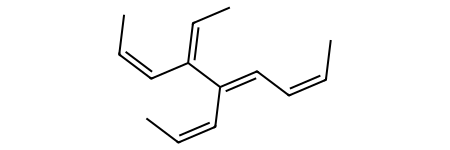

In [25]:
dm.to_mol(dm.to_smiles(mol, canonical=False, isomeric=True))

In [6]:
ddf = dd.read_csv(file[0])

In [22]:
group_id = "004"
ignore_isotops = ("001", "002", "003", "006", "011", "014")

normalize = partial(preprocess_smiles, check_isotopes=(group_id not in ignore_isotops))
normalize("N[C@@H]([CH2]S)C(=O)O")

True


'N[C@@H](CS)C(=O)O'

In [7]:
ddf["SMILES"] = ddf["SMILES"].apply(preprocess_smiles, meta=("SMILES", str))

In [8]:
def remove_isomers(smi: str) -> str | None:
    mol = Chem.MolFromSmiles(smi)
    return dm.to_smiles(mol, canonical=True, isomeric=False) if mol else None

In [9]:
ddf["canonical_SMILES"] = ddf["SMILES"].apply(remove_isomers, meta=("canonical_SMILES", str))

In [10]:
ddf = ddf.compute()

2025-12-19 19:43:09,346 - distributed.worker - ERROR - Compute Failed
Key:       ('apply-7332bee9f58324845c6c4642efb355e5', 0)
State:     executing
Task:  <Task ('apply-7332bee9f58324845c6c4642efb355e5', 0) apply(...)>
Exception: "TypeError('No registered converter was able to produce a C++ rvalue of type std::__cxx11::basic_string<wchar_t, std::char_traits<wchar_t>, std::allocator<wchar_t> > from this Python object of type NoneType')"
Traceback: '  File "/home/ruite/miniforge3/envs/ai_factory/lib/python3.13/site-packages/dask/utils.py", line 1235, in __call__\n    return getattr(__obj, self.method)(*args, **kwargs)\n           ~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^\n  File "/home/ruite/miniforge3/envs/ai_factory/lib/python3.13/site-packages/pandas/core/series.py", line 4943, in apply\n    ).apply()\n      ~~~~~^^\n  File "/home/ruite/miniforge3/envs/ai_factory/lib/python3.13/site-packages/pandas/core/apply.py", line 1422, in apply\n    return self.apply_standard()\n           ~~

TypeError: No registered converter was able to produce a C++ rvalue of type std::__cxx11::basic_string<wchar_t, std::char_traits<wchar_t>, std::allocator<wchar_t> > from this Python object of type NoneType

### SMARTS

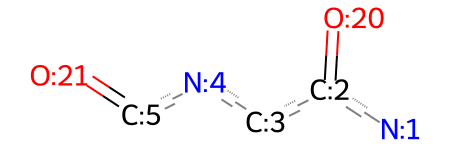

In [ ]:
PEPTIDE_SMARTS = "[NX3:1][CX3:2](=[OX1:20])[CX4:3][NX3:4][CX3:5](=[OX1:21])"

Q = Chem.MolFromSmarts(PEPTIDE_SMARTS)
Q

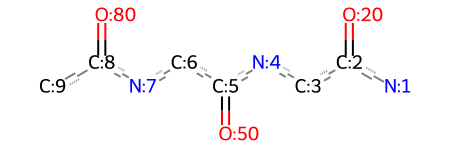

In [5]:
peptide = "[NX3:1][CX3:2](=[OX1:20])[CX4:3][NX3:4][CX3:5](=[OX1:50])[CX4:6][NX3:7][CX3:8](=[OX1:80])[CX4:9]"
Q = Chem.MolFromSmarts(peptide)
Q

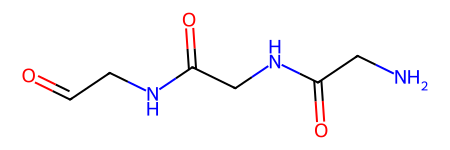

In [14]:
mol = dm.to_mol("NCC(=O)NCC(=O)NCC(=O)")
mol

In [ ]:
is_true_peptide(mol)

False

In [18]:
for match in mol.GetSubstructMatches(Q):
    # Build map#:target_idx dictionary from the query order
    mapnum_to_idx = {}
    for q_atom, tgt_idx in zip(Q.GetAtoms(), match):
        amap = q_atom.GetAtomMapNum()
        if amap:
            mapnum_to_idx[amap] = tgt_idx

In [19]:
mapnum_to_idx

{1: 16,
 2: 14,
 20: 15,
 4: 13,
 5: 12,
 6: 10,
 60: 11,
 7: 9,
 8: 8,
 9: 6,
 90: 7,
 10: 5}

In [ ]:
mol = dm.to_mol("CSC[Si](C)(C)C")
allowed_atomic_numbers = {1, 6, 7, 8, 9, 15, 16, 17, 35, 53}  # H, C, N, O, F, P, S, Cl, Br, I
# allowed_atomic_numbers.update({5, 34}) Boron and Selenium
# Check for rare elements
has_rare = any(atom.GetAtomicNum() not in allowed_atomic_numbers for atom in mol.GetAtoms())
for atom in mol.GetAtoms():
    print(atom.GetAtomicNum())

6
16
6
14
6
6
6


### Isotops

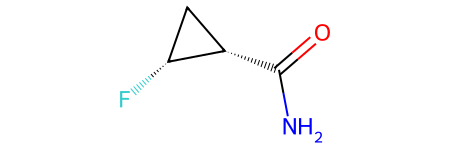

In [13]:
smiles = 'NC(=O)[C@H]1C[C@H]1F'
Chem.MolFromSmiles(smiles)

In [12]:
has_iso = any(atom.GetIsotope() != 0 for atom in Chem.MolFromSmiles(smiles).GetAtoms())
has_iso

False

### Run preprocess

In [ ]:
def split_csv_groups_by_size(
    base_paths: dict[str, list[str, list[str]]],
    size_limit_gb: int = 400
) -> dict[str, list[str]]:
    """
    Dynamically split large CSV datasets into groups of ~size_limit_gb.

    Parameters
    ----------
    base_paths : dict
        e.g. {"002": "ZINC22/smiles_csv/*", "003": "Savi/*/*.csv"}
    size_limit_gb : int
        Max cumulative size per group (in GB).

    Returns
    -------
    dict
        e.g. {"002_1": ["ZINC22/smiles_csv/H04/file1.csv", ...], "003": ["Savi/a.csv", ...]}
    """
    size_limit = size_limit_gb * (1024 ** 3)
    new_mapping = {}

    for dbid, patterns in base_paths.items():
        if isinstance(patterns, str):
            patterns = [patterns]

        # Gather all CSV files from given patterns
        all_files = []
        for pattern in patterns:
            all_files.extend(Path().glob(str(pattern)))

        # Filter to only existing CSV files
        all_files = [p for p in all_files if p.is_file() and p.suffix.lower() == ".csv"]

        # Collect file sizes
        file_sizes = [(p, p.stat().st_size) for p in all_files]
        file_sizes.sort(key=lambda x: x[0].as_posix())  # deterministic ordering

        # Group by cumulative size
        current_group, current_size, group_num = [], 0, 1
        for p, fsize in file_sizes:
            # if a single file is larger than threshold → its own group
            if fsize > size_limit:
                key = f"{dbid}_{group_num:02d}"
                new_mapping[key] = [str(p)]
                group_num += 1
                continue

            if current_size + fsize > size_limit and current_group:
                key = f"{dbid}_{group_num:02d}" if group_num > 1 else f"{dbid}_1"
                new_mapping[key] = [str(f) for f in current_group]
                group_num += 1
                current_group, current_size = [], 0

            current_group.append(p)
            current_size += fsize

        # Add any leftovers
        if current_group:
            key = f"{dbid}_{group_num:02d}" if group_num > 1 else dbid
            new_mapping[key] = [str(f) for f in current_group]

    return new_mapping

In [ ]:
ddf["canonical"] = ddf["canonical_smiles"].map(preprocess_smiles, meta=("canonical", str))
ddf = ddf.dropna(subset=["canonical_smiles"])
missing = ddf[ddf["canonical"].isnull()].compute()
ddf = ddf.drop_duplicates(subset=["canonical_smiles"])
#ddf.to_parquet("../../Coconut/cleaned_coconut", write_index=False) # escribe como un null dast index, así que remove

In [9]:
for x in missing.canonical_smiles:
    try:
        Chem.MolToSmiles(Chem.MolFromSmiles(x))
    except Exception as e:
        print(x)

O=[P](=O)(O)P(=O)(=O)(O)P(=O)(=O)(O)P(=O)(=O)(O)P(=O)(=O)(O)[P](=O)(=O)O
C/C=C\[C@H]1C[C@H]2C(=O)O[C@H](C)[C@@H](NC(=O)[C@H](CC3C[C@H]3[NH2+2]([O-])[O-])NC(=O)C3=CC=C(Cl)N3O)C(=O)NC([C@H](C)C3=CC=CC=C3)C(=O)NC(CC3C[C@H]3[NH2+2]([O-])[O-])C(=O)N[C@@H]([C@H](C)C3=CC=CC=C3)C(=O)NC([C@@H](C)CC)C(=O)N2C1
O=[P](=O)(O)O
[HeH]C(CO)(C(N)=O)C1=CC=CC=C1


[14:36:24] Explicit valence for atom # 1 P, 6, is greater than permitted
[14:36:24] Explicit valence for atom # 20 N, 5, is greater than permitted
[14:36:24] Explicit valence for atom # 1 P, 6, is greater than permitted
[14:36:24] Explicit valence for atom # 0 He, 2, is greater than permitted


### Try deduplicate

In [ ]:
smiles = df.canonical_smiles.iloc[0]
mol  =  Chem.MolFromSmiles(smiles)
smil_group = pd.Series({i:Chem.MolToSmiles(mol,  doRandom=True)  for  i  in  range(5)})
smil_group = smil_group.map(normalize_smiles)
smil_group.drop_duplicates()

[13:52:30] Running LargestFragmentChooser
[13:52:30] Running Uncharger
[13:52:30] Running LargestFragmentChooser
[13:52:30] Running Uncharger
[13:52:30] Running LargestFragmentChooser
[13:52:30] Running Uncharger
[13:52:30] Running LargestFragmentChooser
[13:52:30] Running Uncharger
[13:52:30] Running LargestFragmentChooser
[13:52:30] Running Uncharger


0    COc1cccc2c1C(=O)c1c(O)c3c(c(O)c1C2=O)C[C@@](O)...
dtype: object

## Pubchem

In [6]:
from rdkit.Chem.SaltRemover import SaltRemover

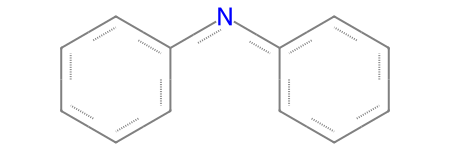

In [7]:
remover = SaltRemover()
remover.salts[14] # 15 salts are removed by default -> the largest fragment is it pertinent

In [8]:
ddf_pub = dd.read_csv(file)
df_pub = pd.read_csv(file[0], index_col=0)
ddf_pub_1 = dd.read_csv(file[1])

In [9]:
canonical = ddf_pub_1["SMILES"].map(preprocess_smiles, meta=("Mol", str))
future = client.compute(canonical)
cano = future.result()

KeyboardInterrupt: 

In [ ]:
canonical = ddf_pub["SMILES"].map(preprocess_smiles, meta=("Mol", str))
missing = canonical[canonical.isna()]
cano = canonical.compute()
missing = missing.compute()

In [34]:
len(ddf_pub), len(cano)

(3010728, 3010728)

In [65]:
ddf_pub_1.drop(columns=["dockscore"]).head()

,ID,SMILES
0,CID_3000001,CN(C)C(CNC(=O)CN1C(=O)C2(CCC3=CC=CC=C32)NC1=O)...
1,CID_3000002,C1=CC=C2C(=C1)N=C3N2C(N=C(N3)N)C4=CC=C(C=C4)Cl
2,CID_3000003,C1=CC=C2C(=C1)N=C(S2)COC(=O)CC3=CN4C=CSC4=N3
3,CID_3000004,COC1=CC=C(C=C1)N2CCN(CC2)C(=O)C3=CC=C(C=C3)NS(...
4,CID_3000005,C1COCCN1CCNC(=O)NC2(OC3=C(O2)C=C(C=C3)Cl)C(F)(F)F


In [11]:
salted = []
for i, row in ddf_pub.iterrows(): # for x in ddf_pub["SMILES"]:
    x = row["SMILES"]
    id = row["ID"]
    if "." in x:
        salted.append(x)
        print(id, x)

CID_318 CC1C2C(C(C(=N2)CC3=NC(=C(C4=NC(C5C(C(C1=N5)(C)CCC(=O)NCC(C)O)CC(=O)N)(C(C4CCC(=O)N)(C)CC(=O)N)C)C)C(C3CCC(=O)N)(C)CC(=O)N)(C)C)CCC(=O)N.[Co]
CID_539 CC1C2C(C(C(=N2)CC3=NC(=C(C4=NC(C5C(C(C1=N5)(C)CCC(=O)O)CC(=O)O)(C(C4CCC(=O)O)(C)CC(=O)N)C)C)C(C3CCC(=O)O)(C)CC(=O)N)(C)C)CCC(=O)O.[Co]
CID_566 CC(=O)O.C1=CC=C(C=C1)[Hg]
CID_1096 CC1(C(C2=CC3=NC(=CC4C(C(=C([N-]4)C=C5C(C(C([N-]5)C=C1[N-]2)CCC(=O)O)CC(=O)O)CCC(=O)O)CC(=O)O)C(C3CCC(=O)O)(C)CC(=O)O)CCC(=O)O)CC(=O)O.[Fe+3]
CID_1301 CC(C1=CC2=C(C=C1)C=C(C=C2)OC)C(=O)[O-].[Na+]
CID_1569 C1=CC=[N+](C(=C1)[S-])[O-].[Na+]
CID_1905 C1C2C(C(C(O2)N3C4=NC=NC(=C4N=C3SC5=CC=C(C=C5)Cl)N)O)OP(=O)(O1)[O-].[Na+]
CID_2114 C1=CC=C2C(=C1)C=CC=C2OP(=O)(O)[O-].[Na+]
CID_2436 CC(CC1=CC=C(C=C1)OCC(=O)[O-])NCC(C2=CC(=CC=C2)Cl)O.[Na+]
CID_2514 CC(=O)O.CC(=O)O.[Cd]
CID_2529 CC(C)(CO)C(C(=O)NCCC(=O)[O-])O.CC(C)(CO)C(C(=O)NCCC(=O)[O-])O.[Ca+2]
CID_2567 C1CC(C1)(C(=O)O)C(=O)O.[Pt]
CID_2767 [NH2-].[NH2-].Cl[Pt+2]Cl
CID_2821 C1=C(C(=CC2=C1N=C(C(=N2)[O-])[O-])[N+](=O)

In [ ]:
salted = [Chem.MolFromSmiles(x, sanitize=True) for x in salted]

NameError: name 'salted' is not defined

In [25]:
a = Chem.MolToSmiles
b = Chem.MolFromSmiles

In [ ]:
m2 = b("N[Zn]N")
rdMolStandardize.CleanupInPlace(m2)
a(m2)

[11:19:46] Initializing MetalDisconnector
[11:19:46] Running MetalDisconnector
[11:19:46] Removed covalent bond between Zn and N
[11:19:46] Removed covalent bond between Zn and N
[11:19:46] Initializing Normalizer
[11:19:46] Running Normalizer


'[NH2-].[NH2-].[Zn+2]'

In [54]:
a(salted[19])

'COc1cc(C(CN(CC(=O)[O-])CC(=O)[O-])N(CC(=O)[O-])CC(=O)[O-])c([N+](=O)[O-])cc1OC.[Na+].[Na+].[Na+].[Na+]'

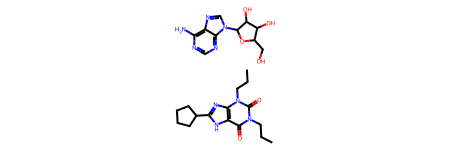

In [64]:
salted[-2]

In [67]:
rdMolStandardize.LargestFragmentChooser().chooseInPlace(salted[-2])

[16:25:13] Running LargestFragmentChooser
[16:25:13] Fragment: CCCn1c(=O)c2[nH]c(C3CCCC3)nc2n(CCC)c1=O
[16:25:13] New largest fragment: CCCn1c(=O)c2[nH]c(C3CCCC3)nc2n(CCC)c1=O (46)
[16:25:13] Fragment: Nc1ncnc2c1ncn2C1OC(CO)C(O)C1O


In [41]:
m = Chem.MolFromSmiles("[N+](=O)[O-]")
normalizer = rdMolStandardize.Normalizer()
normalized = normalizer.normalize(m)
Chem.MolToSmiles(normalized)

[15:53:23] Initializing Normalizer
[15:53:23] Running Normalizer


'O=[N+][O-]'

[15:44:35] Tautomer enumeration stopped at 716 tautomers: max transforms reached


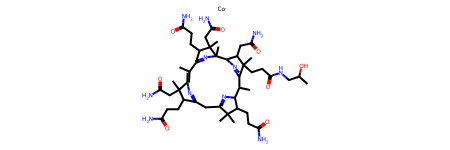

In [35]:
te = rdMolStandardize.TautomerEnumerator()
te.Canonicalize(salted[0])

## Calculate HAC

In [4]:
from rdkit.Chem import Descriptors as des
from rdkit.Chem import rdMolDescriptors as rdes

In [ ]:
def get_hac(smi: str) -> int :
    """Calculate Heavy Atom Count (HAC) from SMILES
    
    Parameters
    ----------
    smi : str
        SMILES string
    """
    mol = Chem.MolFromSmiles(smi)
    return mol.GetNumHeavyAtoms()

def rename_partitions(output_folder: Path | str, hac: int):
    """Rename partitions to HAC_xx_01.parquet, HAC_xx_02.parquet, etc.
    
    Parameters
    ----------
    hac : int
        HAC value
    output_folder : Path
        Output folder path
    """
    output_folder = Path(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)
    files = sorted(Path(f"{output_folder}/HAC_{hac:02d}").glob("*.parquet"))
    for i, f in enumerate(files, start=1):
        new_name = output_folder / f"HAC_{hac:02d}/HAC{hac:02d}_{i:02d}.parquet"
        f.rename(new_name)

def write_db_by_hac(db_id: str, pattern: str, output_folder: Path, output_folder_missing: Path):
    """
    Process one database: normalize SMILES, deduplicate locally,
    split by HAC, and append to HAC-specific Parquet folders.
    Parameters
    ----------
    db_id : str
        Database ID
    pattern : str
        Path to CSV file patterns
    output_folder : Path
        Output folder path    
    output_folder_missing : Path
        Output folder for incorrect SMILES
    """
    ddf = dd.read_csv(pattern, blocksize="512MB")
    ddf["db_id"] = db_id

    # Normalize
    ddf["SMILES"] = ddf["SMILES"].map(preprocess_smiles, meta=("SMILES", str))

    # Separate missing SMILES
    ddf_missing = ddf[ddf["SMILES"].isna()]
    ddf = ddf.dropna(subset=["SMILES"])

    # Deduplicate within this DB only
    ddf = ddf.drop_duplicates(subset="SMILES")

    # HAC calculation
    ddf["HAC"] = ddf["SMILES"].map(get_hac, meta=("HAC", int))

    # Write missing SMILES
    ddf_missing.to_parquet(
        output_folder_missing / f"{db_id}/",
        write_index=False,
        compute=True,
        append=True,
    )

    # Partition and write by HAC
    ddf_hac = ddf_hac.drop(columns=["HAC"])  # Keep only relevant columns
    # Repartition into manageable chunks (optional)
    n_parts = max(1, int(len(ddf_hac) / 1e6))  # Aim for ≤1M rows per partition because this is for each db
    ddf_hac = ddf_hac.repartition(npartitions=n_parts)

    # Append to existing Parquet files
    ddf_hac.to_parquet(
        out_path,
        write_index=False,
        compute=True,
        append=True,
    )

        rename_partitions(output_folder, hac)
        print(f"DB {db_id} → HAC {hac} written to {out_path}")

In [6]:
df_pub_1 = pd.read_csv(file[1], index_col=0)

In [32]:
des.HeavyAtomCount(salted[-2]), rdes.CalcNumHeavyAtoms(salted[-2]), rdes.CalcNumHeavyAtoms(mol), des.HeavyAtomCount(mol)

(35, 35, 30, 30)

In [11]:
RDLogger.DisableLog('rdApp.*')  # Disable RDKit warnings
ddf = pd.read_csv(file[1])
#ddf = dd.read_csv("../../Coconut/coconut_csv-03-2025_clean.csv")
ddf["db_id"] = "007"

# Normalize
ddf["SMILES"] = ddf["SMILES"].map(normalize_smiles)

# Separate missing SMILES
ddf_missing = ddf[ddf["SMILES"].isna()]
ddf = ddf.dropna(subset=["SMILES"])

# Deduplicate within this DB only
ddf = ddf.drop_duplicates(subset="SMILES")
# HAC calculation
#ddf["HAC"] = ddf["SMILES"].map(get_hac)
#ddf = ddf.compute()

In [37]:
dof = pd.read_csv(file[1])
dof["SMILES"] = dof["SMILES"].map(preprocess_smiles)
ddf = ddf.dropna(subset=["SMILES"])

In [31]:
dof_missing = dof[dof["SMILES"].isna()]
dof_missing

,ID,SMILES,dockscore
1,CID_500003,None,0
2,CID_500004,None,0
3,CID_500006,None,0
4,CID_500007,None,0
5,CID_500008,None,0
...,...,...,...
456072,CID_999984,None,0
456074,CID_999986,None,0
456080,CID_999992,None,0
456082,CID_999994,None,0


In [13]:
ddf["HAC"] = ddf["SMILES"].map(get_hac)

In [26]:
ddf[ddf["ID"] == "CID_643598"]

,ID,SMILES,dockscore,db_id,HAC
125709,CID_643598,Cl[P-](Cl)(Cl)(Cl)(Cl)Cl,0,007,7


In [31]:
Chem.MolFromSmiles(" O=c1ncnc2c1n(Cc1ccccc1)cn2Cc1ccccc1")

In [1]:
ddf_pub_1["HAC"] = ddf_pub_1["SMILES"].map(get_hac, meta=("HAC", int))
ddf_pub_1["HAC"].compute()

NameError: name 'ddf_pub_1' is not defined

In [59]:
Chem.MolFromSmiles(a.iloc[1]["SMILES"]).GetNumHeavyAtoms()

21

## Representative

In [1]:
import datamol as dm

In [2]:
smi = "[O-][N+]1=CC=CC=C1SCC1=NC=CC=[N+]1[O-]"
smi = "C1=CC=[N+](C(=C1)[S-])[O-].[Na+]"
smi2 = "C[C@H](O)F"

In [21]:
mol = dm.to_mol(smi, ordered=True)
mol = dm.fix_mol(mol, largest_only=True if "." in smi else False)
m1 = dm.standardize_mol(
        mol,
        disconnect_metals=True,
        normalize=False,
        reionize=True,
        uncharge=True,
        stereo=True,
        )
m2 = dm.standardize_mol(
        mol,
        disconnect_metals=True,
        normalize=False,
        reionize=True,
        uncharge=False,
        stereo=False,
        )
smi2 = dm.to_smiles(m1, canonical=True, isomeric=True)
smi3 = dm.to_smiles(m2, canonical=True, isomeric=True)
smi2 == smi3

[09:36:07] WARNING: not removing hydrogen atom without neighbors
[09:36:07] Running LargestFragmentChooser
[09:36:07] Fragment: [Na+]
[09:36:07] New largest fragment: [Na+] (1)
[09:36:07] Fragment: [O-][n+]1ccccc1[S-]
[09:36:07] New largest fragment: [O-][n+]1ccccc1[S-] (12)
[09:36:07] Initializing MetalDisconnector
[09:36:07] Running MetalDisconnector
[09:36:07] Running Uncharger
[09:36:07] Removed negative charge.
[09:36:07] Initializing MetalDisconnector
[09:36:07] Running MetalDisconnector


False

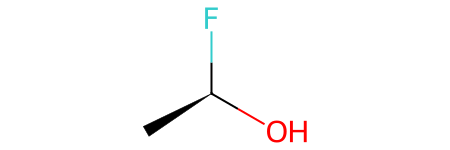

In [4]:
mol = dm.to_mol(smi2, ordered=True)
#Chem.RemoveStereochemistry(mol)
mol

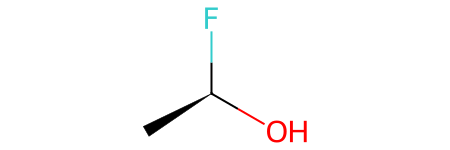

In [5]:
dm.standardize_mol(
        mol,
        disconnect_metals=False,
        normalize=False,
        reionize=True,
        uncharge=False,
        stereo=True,
        )

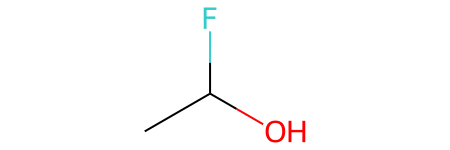

In [7]:
dm.to_mol(dm.to_smiles(mol, canonical=True, isomeric=False))

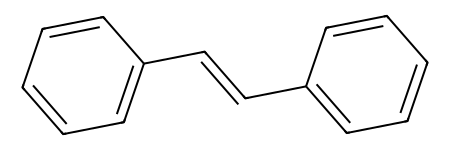

In [80]:
s = "c1ccccc1/C=C/c2ccccc2"
mol = dm.to_mol(s, ordered=True)
mol

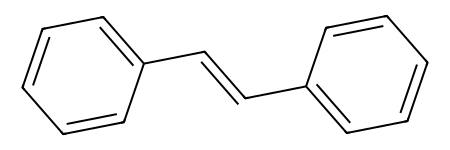

In [ ]:
m = dm.to_smiles(mol, canonical=True, isomeric=True)
dm.standardize_mol(
        mol,
        disconnect_metals=False,
        normalize=False,
        reionize=True,
        uncharge=False,
        stereo=False,
        )

In [32]:
Chem.MolToSmiles(mol, canonical=True, isomericSmiles=True)

'[O-][n+]1ccccc1SCc1nccc[n+]1[O-]'

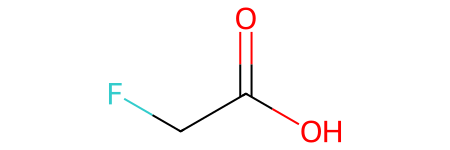

In [24]:
Chem.MolFromSmiles("O=C(O)CF")

### Problematic

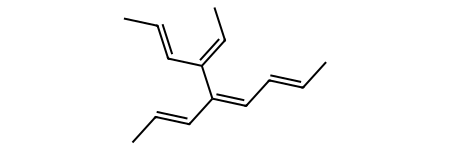

In [3]:
smi = r"C/C=C\C=C(/C=C\C)C(/C=C\C)=C/C"
mol = Chem.MolFromSmiles(smi)
smi =dm.to_smiles(mol, canonical=True, isomeric=False)
mol = dm.to_mol(smi)
mol

In [ ]:
import numpy as np

s1 = "F[C@H](Cl)Br"
s2 = "F[C@@H](Cl)Br"

fp1 = dm.to_fp(stereo[1], fpSize=1024, includeChirality=True)
fp2 = dm.to_fp(stereo[10], fpSize=1024, includeChirality=True)

In [170]:
np.where(fp1 != fp2)

(array([  64,  108,  134,  215,  238,  337,  373,  404,  422,  483,  515,
         581,  652,  690,  721,  727,  749,  764,  771,  786,  814,  850,
         869,  872,  879,  905,  918,  939,  940,  957,  963, 1017]),)

In [174]:
fp1[64], fp2[64], fp1[879], fp2[879]

(1, 0, 1, 0)

In [4]:
from rdkit import Chem
from rdkit.Chem.EnumerateStereoisomers import EnumerateStereoisomers, StereoEnumerationOptions

rand=None
stereo_opts = StereoEnumerationOptions(
    tryEmbedding=True,
    onlyUnassigned=False,
    maxIsomers=4,
    unique=True,
    rand=rand if rand is not None else None
)

isomers = list(EnumerateStereoisomers(mol, options=stereo_opts))


In [6]:
stereo = dm.enumerate_stereoisomers(mol, 5, rationalise=True, clean_it=False)
sm = [dm.to_mol(dm.to_smiles(x, canonical=True, isomeric=True)) for x in stereo]
sm

In [8]:
mols = sm

In [9]:
inputs = [{"mol": mol, "clean_it":False, "n_variants":4, "timeout_seconds":None} for mol in mols]

out = dm.parallelized(
    dm.enumerate_stereoisomers,
    inputs,
    arg_type="kwargs",
    progress=True,
    n_jobs=-1,
    scheduler="threads",
)


/home/ruite/miniforge3/envs/ai_factory/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
  0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 5/5 [00:00<00:00, 15.16it/s]


In [11]:
out[0]

In [13]:
pd.concat({f"{i}":dm.to_df(x, smiles_column="SMILES") for i, x in enumerate(out)})

SMILES
0 0  C/C=C\C=C(\C=C/C)C(/C=C\C)=C\C
  1  C/C=C\C=C(/C=C\C)C(/C=C\C)=C/C
  2  C/C=C\C(=C/C)C(/C=C/C)=C\C=C\C
  3  C/C=C\C(=C\C=C\C)C(=C/C)\C=C\C
1 0  C/C=C\C=C(\C=C/C)C(/C=C\C)=C\C
  1  C/C=C\C=C(/C=C\C)C(/C=C\C)=C/C
  2  C/C=C\C(=C/C)C(/C=C/C)=C\C=C\C
  3  C/C=C\C(=C\C=C\C)C(=C/C)\C=C\C
2 0  C/C=C\C=C(\C=C/C)C(/C=C\C)=C\C
  1  C/C=C\C=C(\C=C/C)C(/C=C\C)=C/C
  2  C/C=C/C=C(/C=C/C)C(/C=C/C)=C\C
  3  C/C=C\C=C(/C=C\C)C(=C/C)\C=C\C
3 0  C/C=C\C=C(\C=C/C)C(/C=C\C)=C\C
  1  C/C=C\C=C(/C=C\C)C(/C=C\C)=C/C
  2  C/C=C(/C=C/C)C(/C=C/C)=C\C=C\C
  3  C/C=C\C=C(\C=C\C)C(/C=C\C)=C/C
4 0  C/C=C\C=C(\C=C/C)C(/C=C\C)=C\C
  1  C/C=C\C=C(\C=C/C)C(/C=C\C)=C/C
  2  C/C=C/C=C(/C=C/C)C(/C=C/C)=C\C
  3  C/C=C\C=C(/C=C\C)C(=C/C)\C=C\C

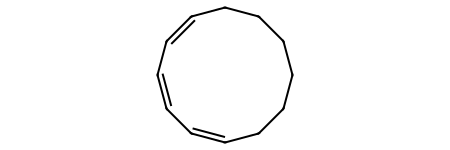

In [196]:
smi = r"C1CC/C=C\C=C\C=C/CCC1"
mol = Chem.MolFromSmiles(smi)
Chem.RemoveStereochemistry(mol)
mol

### Examples

In [7]:
mol_651 = dd.read_parquet("/home/ruite/Projects/AI factory/Drug database/Molecular_database/651/*.parquet")

In [8]:
mol1 = dd.read_parquet("/home/ruite/Projects/AI factory/Drug database/Molecular_database/1/*.parquet")
mol29 = dd.read_parquet("/home/ruite/Projects/AI factory/Drug database/Molecular_database/29/*.parquet")
mol100 = dd.read_parquet("/home/ruite/Projects/AI factory/Drug database/Molecular_database/100/*.parquet")

In [ ]:
ddf = dd.read_csv(r"C:\Proyectos\BSC\AI factory\Drug database\Coconut\coconut_csv-03-2025_clean.csv", blocksize="128MB", usecols=["ID","SMILES"])

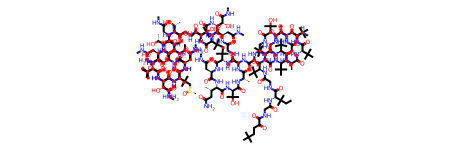

In [20]:
npa = pd.read_csv(r"C:\Proyectos\BSC\AI factory\Drug database\NPAtlas_download_clean.csv")
Chem.MolFromSmiles(npa.iloc[28334]["SMILES"]) 

In [14]:
sm2 = mol29["SMILES"].head(4)
m_2 = [Chem.MolFromSmiles(x) for x in sm2]

In [17]:
sm1 = mol_651["SMILES"].compute()
m_1 = [Chem.MolFromSmiles(x) for x in sm1]

In [9]:
sm1 = mol100["SMILES"].head(4)
m_100 = [Chem.MolFromSmiles(x) for x in sm1]

## Encode

In [9]:
import hashlib, struct
import numpy as np
from collections import Counter

In [10]:
def decode_id(packed, db_bits=5, hac_bits=10, hash_bits=49):
    """
    Returns (db_id, HAC, hash_part) from a 64-bit packed integer
    """
    hash_mask = (1 << hash_bits) - 1
    hac_mask  = (1 << hac_bits) - 1
    db_mask   = (1 << db_bits) - 1

    hash_part = packed & hash_mask
    hac       = (packed >> hash_bits) & hac_mask
    db_id     = (packed >> (hac_bits + hash_bits)) & db_mask
    return int(db_id), int(hac), int(hash_part)


def decode_ids(packed_ids: np.ndarray, db_bits=5, hac_bits=10, hash_bits=49):
    """
    Vectorized decoding of packed 64-bit IDs.

    Parameters
    ----------
    packed_ids : np.ndarray of np.uint64
        Encoded IDs as produced by encode_id().
    db_bits, hac_bits, hash_bits : int
        Bit allocations (must match encode_id).

    Returns
    -------
    dict of np.ndarray:
        {
            "db_id": np.ndarray of np.uint64,
            "hac": np.ndarray of np.uint64,
            "hash_part": np.ndarray of np.uint64
        }
    """
    packed_ids = packed_ids.astype(np.uint64)

    hash_mask = np.uint64((1 << hash_bits) - 1)
    hac_mask  = np.uint64((1 << hac_bits) - 1)
    db_mask   = np.uint64((1 << db_bits) - 1)

    hash_part = packed_ids & hash_mask
    hac       = (packed_ids >> hash_bits) & hac_mask
    db_id     = (packed_ids >> (hash_bits + hac_bits)) & db_mask

    return {
        "db_id": db_id,
        "hac": hac,
        "hash_part": hash_part,
    }

def encode_id(df, hac: int, db_bits=5, hac_bits=10, hash_bits=49):
    """
    Vectorized 64-bit packed ID generation using 128-bit blake2b hash folded to 64 bits.

    Combines db_id, HAC, and a 49-bit hash into a unique 64-bit integer.

    Parameters
    ----------
    df : DataFrame partition (must have columns 'ID' and 'db_id')
    hac : int
        Heavy atom count to embed
    db_bits, hac_bits, hash_bits : int
        Bit allocation (must sum to <= 64)
    """
    assert db_bits + hac_bits + hash_bits <= 64, "Bit allocations exceed 64 bits"

    ids = df["ID"].to_numpy(dtype=str)
    db_ids = df["db_id"].to_numpy(dtype=np.uint64)
    n = len(ids)

    # Masks and shifts
    hash_mask = np.uint64((1 << hash_bits) - 1)
    db_mask   = np.uint64((1 << db_bits) - 1)
    db_shift  = np.uint64(hac_bits + hash_bits)
    hac_shift = np.uint64(hash_bits)
    hac_arr   = np.full(n, np.uint64(hac), dtype=np.uint64)

    # Ensure db_id fits allocated bits
    db_ids = db_ids & db_mask
    assert np.all(db_ids < (1 << db_bits)), f"db_id exceeds {2**db_bits-1}"

    # Generate 128-bit Blake2b hash and fold into 64 bits
    full_hashes = np.empty(n, dtype=np.uint64)
    for i, s in enumerate(ids):
        h = hashlib.blake2b(s.encode("utf-8"), digest_size=16).digest()
        hi, lo = struct.unpack(">QQ", h)
        full_hashes[i] = np.uint64(hi ^ lo)

    # Keep only hash_bits bits
    hash_parts = full_hashes & hash_mask

    # Pack fields: [db_id | HAC | hash_part]
    packed_ids = (db_ids << db_shift) | (hac_arr << hac_shift) | hash_parts
    return packed_ids


def rename_partitions(output_folder: Path):
    """
    Adjust renaming logic for new database structure:
    - Remove db_id level
    - Rename HAC folders from HAC=value to HAC_value
    - Rename parquet files to HAC_value_dbid_X.parquet
    """
    output_folder = Path(output_folder)

    # Traverse db_id folders
    for db_folder in output_folder.iterdir():
        if not db_folder.is_dir():
            continue
        # Inside each db_id, look for HAC=* folders
        for hac_folder in db_folder.glob("HAC=*"):
            hac_value = hac_folder.name.split("=")[-1]
            new_hac_folder = output_folder / f"HAC_{hac_value}"
            new_hac_folder.mkdir(exist_ok=True, parents=True)

            # Move and rename parquet files
            for i, parquet_file in enumerate(hac_folder.glob("*.parquet"), start=1):
                new_name = new_hac_folder / f"HAC{hac_value}_db{db_folder.name.split("_")[0]}_{i:02d}.parquet"
                parquet_file.rename(new_name)
            # Remove old HAC folder
            if not any(hac_folder.iterdir()):
                hac_folder.rmdir()

        # Remove old db_id folder
        if not any(db_folder.iterdir()):
            db_folder.rmdir()

def make_name_function(hac: int):
    def name_function(i: int) -> str:
        return f"HAC{hac}_{i:02d}.parquet"
    return name_function

def check_files(pattern: list[str], db_id: str) -> list[str]:
    """
    Check if all files in pattern contain ID and SMILES columns
    """
    wrong_files = []
    right_files = []
    for f in pattern:
        try:
            cols = pd.read_csv(f, nrows=0).columns
            if not all(c in cols for c in ["ID", "SMILES", "db_id"]):
                wrong_files.append(f"{f}\n") 
                continue
        except Exception as e:
            print(e)
            wrong_files.append(f"{f}\n")
            continue
        
        right_files.append(f)
        
    if wrong_files:    
        with open(f"wrong_{db_id}.txt", "w", encoding="utf-8") as wrong:
            wrong.writelines(wrong_files)
            
    return right_files

def get_hac(smiles_series):
    """Compute HAC for a pandas Series of SMILES in a vectorized partition."""
    mols = [Chem.MolFromSmiles(smi) for smi in smiles_series]
    hacs = [mol.GetNumHeavyAtoms() if mol else 0 for mol in mols]
    return pd.Series(hacs, index=smiles_series.index)


In [11]:
out_path = Path("../../Molecular_database")
hac_folders = out_path / "HAC_19"
hac_folders

PosixPath('../../Molecular_database/HAC_19')

In [5]:
a = dd.read_parquet("/home/ruite/Projects/AI factory/Drug database/Molecular_database/HAC_20/HAC20_db009_03.parquet")
l = a.drop_duplicates(subset=["SMILES"]).drop_duplicates(subset=["ID"])
l["ID"] = l.map_partitions(
        lambda df: pd.Series(
            encode_id(df, hac=140),
            index=df.index
        ),
        meta=("packed_id", "uint64")
    )

In [8]:
import pyarrow.parquet as pq

In [9]:
out_path = Path("../../Molecular_database/")
hacs = sorted(out_path.glob("HAC*"), key=lambda x: int(x.name.split("_")[-1]))
p = list(hacs[3].glob("*.parquet"))
pq.ParquetFile(p[0]).schema.names

['ID', 'SMILES', 'db_id']

In [ ]:
hac_folders = out_path / "HAC_19"
meta = {"ID": "string", "SMILES": "string", "db_id": "string", "num_ID": "int64"}
use_cols = ["ID", "SMILES"]
hac = hac_folders.name.split("_")[-1]   
ddf_merged = dd.read_parquet(f"{hac_folders}/*.parquet", chunksize="20MB", 
                            columns=[*use_cols, "db_id"])

# Deduplicate across all sources using normalized SMILES
ddf_merged = ddf_merged.drop_duplicates(subset="SMILES").drop_duplicates(subset="ID")
ddf_merged = ddf_merged.repartition(npartitions=3)

In [47]:
import json
with open("test.txt", "w") as f:
    f.write(f"HAC 10# 50# 70 | {json.dumps(ddf_merged.groupby("db_id")["SMILES"].count().compute().to_dict())}")

In [51]:
Path("text.as").touch()

In [53]:
with open("text.as", "r") as st:
    a = st.readlines()
    lines = {int(x.split("#")[0].strip("HAC")): 
                    int(x.strip().split("#")[-1].split("|")[0]) for x in a}

In [54]:
lines

{}

In [11]:
def assign_ids(df, partition_offsets, global_offset, meta):
    """
    Assign unique sequential IDs per partition using map_partitions.
    `partition_offsets` must be broadcast as list of integers.
    """
    # Each partition gets its starting offset from partition_offsets
    def add_ids(partition, partition_info=None):
        pid = partition_info["number"]
        offset = partition_offsets[pid]
        partition["num_ID"] = np.arange(len(partition), dtype=np.int64) + global_offset + offset
        return partition
    
    return df.map_partitions(add_ids, meta=meta)


In [12]:
partition_lengths = ddf_merged.map_partitions(len).compute()
partition_offsets = np.insert(np.cumsum(partition_lengths[:-1]), 0, 0)

df_with_ids = assign_ids(ddf_merged, partition_offsets, 0, meta)

In [15]:
count = int(sum(partition_lengths))
ids = df_with_ids["num_ID"].compute()

In [18]:
df_with_ids.to_parquet(
        out_path / f"cleaned/{hac}",
        write_index=False,
        compute=True,
        engine="pyarrow",
        name_function=make_name_function(hac=int(hac)),
        #schema=meta
    )

In [12]:
ddf_merged.shape[0].compute()

1208491

In [19]:
len(ddf_merged)

1208491

In [33]:
ddf_merged.to_parquet(
    out_path / f"cleaned/{hac}",
    write_index=False,
    compute=True,
    engine="pyarrow",
    name_function=make_name_function(hac=int(hac)),
    append=True
)

## aggregate

In [3]:
ddf = dd.read_csv(r"..//../scubidoo_21m_clean.csv")
ddf["canonical"] = ddf["SMILES"]

In [4]:
def collect_records(pdf):
    return pd.Series({
        "records": list(zip(pdf["SMILES"], pdf["ID"]))
    })

In [5]:
dedup = ddf.groupby("canonical").agg({
    "ID": list,
    "SMILES": list
}, split_out=ddf.npartitions, shuffle="disk")

In [10]:
10_000_000_000/len(ddf)

475.3877500183024

In [ ]:
c = dedup.compute()

In [16]:
b = dedup_list.compute()

/home/ruite/miniforge3/envs/ai_factory/lib/python3.13/site-packages/dask/dataframe/groupby.py:122: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return g.apply(func, *args, **kwargs)


In [11]:
def partition_counts(df):
    return df.groupby("db_id")["SMILES"].count()

# this is a partition groupby
counts_per_partition = a.map_partitions(partition_counts)

In [12]:
counts_per_partition.groupby("db_id").sum().to_frame().rename(columns={"SMILES":"total_counts"}).compute()

,total_counts
db_id,
009,16042
011,295008


### Remove peptides

In [1]:
PEPTIDE_SMARTS = "[NX3:1][CX3:2](=[OX1:20])[CX4:3][NX3:4][CX3:5](=[OX1:21])"
Q = Chem.MolFromSmarts(PEPTIDE_SMARTS)

def _amide_cn_bond_not_ring(mol, a_idx, c_idx):
    b = mol.GetBondBetweenAtoms(a_idx, c_idx)
    return (b is not None) and (not b.IsInRing())

def _has_nonring_carbon_on_nonamide_side(mol, carbonyl_c_idx, amide_n_idx):
    """
    Require an external, NON-RING carbon neighbor on the non-amide side of the carbonyl carbon.
    (Prevents attachment directly to aromatic/ring carbon like ...C(=O)c1...)
    """
    c = mol.GetAtomWithIdx(carbonyl_c_idx)
    for nb in c.GetNeighbors():
        nb_idx = nb.GetIdx()
        if nb_idx == amide_n_idx:
            continue
        b = mol.GetBondBetweenAtoms(carbonyl_c_idx, nb_idx)
        if b is None:
            continue
        # skip the carbonyl oxygen
        if nb.GetAtomicNum() == 8 and b.GetBondType() == Chem.BondType.DOUBLE:
            continue
        # must be carbon, not in a ring, and the bond itself not a ring bond
        if nb.GetAtomicNum() == 6 and (not nb.IsInRing()) and (not b.IsInRing()):
            return True
    return False


def is_true_peptide(input_mol_or_smiles):
    """
    True if the molecule contains two consecutive peptide (amide) bonds where:
      - the motif NX3-C(=O)-CX4-NX3-C(=O) is present,
      - NONE of the matched atoms are in a ring,
      - each amide C-N bond is NOT a ring bond,
      - and each carbonyl carbon is 'internal' to a NON-RING carbon on its non-amide side
        (so ...C(=O)c... is rejected).
    """
    mol = input_mol_or_smiles if isinstance(input_mol_or_smiles, Chem.Mol) \
          else Chem.MolFromSmiles(input_mol_or_smiles)
    if mol is None:
        return False

    for match in mol.GetSubstructMatches(Q):
        # Build map#:target_idx dictionary from the query order
        mapnum_to_idx = {}
        for q_atom, tgt_idx in zip(Q.GetAtoms(), match):
            amap = q_atom.GetAtomMapNum()
            if amap:
                mapnum_to_idx[amap] = tgt_idx

        n1 = mapnum_to_idx[1]
        c1 = mapnum_to_idx[2]
        spacer_c = mapnum_to_idx[3]
        n2 = mapnum_to_idx[4]
        c2 = mapnum_to_idx[5]
        # oxygens are 20,21 if you need them: o1 = mapnum_to_idx[20]; o2 = mapnum_to_idx[21]

        # 1) all matched atoms (including oxygens) must be non-ring
        if any(mol.GetAtomWithIdx(idx).IsInRing() for idx in match):
            continue

        # 2) both amide C–N bonds must not be ring bonds
        if not (_amide_cn_bond_not_ring(mol, n1, c1) and _amide_cn_bond_not_ring(mol, n2, c2)):
            continue

        # 3) require a NON-RING carbon neighbor on the non-amide side of each carbonyl carbon
        if not (_has_nonring_carbon_on_nonamide_side(mol, c1, n1) and
                _has_nonring_carbon_on_nonamide_side(mol, c2, n2)):
            continue

        return True

    return False

NameError: name 'Chem' is not defined

In [ ]:
mol_10 = dd.read_parquet(r"/home/ruite/Projects/AI factory/Drug database/Molecular_database/HAC_488/*.parquet")

In [10]:
sm2 = mol_10["SMILES"].compute()
m_2 = [Chem.MolFromSmiles(x) for x in sm2]

In [11]:
mol = m_2[4]
for i, m in enumerate(m_2):
    if is_true_peptide(m):
        print(Chem.MolToSmiles(m), i)

CCC(C)C1NC(=O)CNC(=O)C2CCCN2C(=O)C(CCCCN)NC(=O)C(C(C)C)NC(=O)C(CCCCN)NC(=O)C2CCCN2C(=O)C(NC(=O)CNC(=O)C2CSSCC3NC(=O)C(CO)NC(=O)C(CCCCN)NC(=O)C(C(C)O)NC(=O)C(C(C)O)NC(=O)C(CCCCN)NC(=O)C4CCCN4C(=O)C(CCC(N)=O)NC(=O)C(CO)NC(=O)C(CO)NC(=O)C(CCC(N)=O)NC(=O)C(CCC(N)=O)NC(=O)C(CC(N)=O)NC(=O)C(Cc4ccc(O)cc4)NC(=O)C(NC(=O)C(CCCNC(=N)N)NC(=O)C(N)CCCNC(=N)N)CSSCC(NC(=O)C(CO)NC(=O)C(CC(N)=O)NC(=O)C(CCC(=O)O)NC(=O)CNC(=O)C4CCCN4C(=O)C4CCCN4C3=O)C(=O)NC(Cc3ccc(O)cc3)C(=O)NC(CC(N)=O)C(=O)NC(CCCCN)C(=O)NC(CCC(N)=O)C(=O)NC(Cc3c[nH]c4ccccc34)C(=O)NC(CCCNC(=N)N)C(=O)NC(CC(=O)O)C(=O)NC(Cc3cnc[nH]3)C(=O)NC(CCCNC(=N)N)C(=O)NCC(=O)NC(CO)C(=O)NC(C(C)CC)C(=O)NC(C(C)O)C(=O)NC(CCC(=O)O)C(=O)NC(CCCNC(=N)N)C(=O)NCC(=O)N2)CSSCC(C(=O)NC2CSSCC(C(=O)NC(CC(N)=O)C(=O)NC(CC(N)=O)C(=O)O)NC(=O)C(CC(=O)O)NC(=O)C(CCC(=O)O)NC(=O)C(CO)NC(=O)C(CCC(=O)O)NC2=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CC(C)C)NC(=O)C(CCCCN)NC1=O 4


# Tests

In [38]:
import pickle as pk

In [39]:
original = pd.read_parquet("../../Molecular_database/7/HAC7_00.parquet")
nochiral = pd.read_csv("../../test/HAC7_00_no_chiral_deduplicated.csv", index_col=0)
a = pd.read_pickle("../../test/dup_mols.pkl")
len(nochiral), len(original), len(original) - len(a), len(nochiral) - 85356, len(a), len(original) - len(nochiral)

(85451, 94485, 85356, 95, 9129, 9034)

In [55]:
rest = original[~original["ID"].isin(nochiral["ID"])]

In [50]:
p = []
for x in a:
    s = list(x)
    s.remove("unk")
    p.append(tuple(s))
r = []
for x in p:
    if len(x) > 2:
        print(x)
    if x[0].split()[0] == x[1].split()[0]:
        print(x)
    r.append(x[0].strip().split()[1])
    r.append(x[1].strip().split()[1]) 

('O=C(O)S(=O)(=O)O CID_18466245', 'O=C(O)S(=O)(=O)O CID_18466245')


In [64]:
dedu = original[original["ID"].isin(r)]
s = dedu[~dedu["ID"].isin(rest["ID"])]["ID"].to_list()
s

['CID_18466245',
 'SCHEMBL13130115',
 'SCHEMBL4136553',
 'CID_135227572',
 'SCHEMBL18198567',
 'SCHEMBL14557281',
 'CID_165070849',
 'ZINC770000002oHt',
 'CID_141276138',
 'SCHEMBL8350851',
 'SCHEMBL1330790',
 'SCHEMBL19686142',
 'ZINC7k0000002n5Y',
 'SCHEMBL16103827',
 'SCHEMBL16481825',
 'SCHEMBL20365631',
 'SCHEMBL17772063',
 'SCHEMBL10855225',
 'CID_117621824',
 'CID_126727421',
 'SCHEMBL25647893',
 'ZINC7e0000003WyK',
 'CID_88251614',
 'SCHEMBL22329002',
 'CID_68014940',
 'SCHEMBL9784988',
 'SCHEMBL5114875',
 'CID_153082606',
 'SCHEMBL13980386',
 'CID_121338391',
 'CID_130432638',
 'CID_88636638',
 'CID_21459277',
 'SCHEMBL9915404',
 'SCHEMBL12153398',
 'SCHEMBL470857',
 'CID_130381435',
 'ZINC7c0000006kDG',
 'SCHEMBL11875200',
 'ZINC7d0000002LHK',
 'SCHEMBL18398206',
 'SCHEMBL2769450',
 'SCHEMBL18312623',
 'SCHEMBL14624159',
 'SCHEMBL24233686',
 'SCHEMBL20146753',
 'SCHEMBL26781596',
 'SCHEMBL17723014',
 'SCHEMBL3649691',
 'SCHEMBL25625038',
 'SCHEMBL3152133',
 'CID_90948944',
 '

In [66]:
a = []
for x in p:
    if x[0].split()[1] in s or x[1].split()[1] in s:
        a.append(x)

In [67]:
a

[('O=C(O)S(=O)(=O)O CID_18466245', 'O=C(O)S(=O)(=O)O CID_18466245'),
 ('N[C@@H](CS)[13C](=O)O Molport-046-689-188',
  'N[C@@H]([13CH2]S)C(=O)O Molport-051-686-465'),
 ('CC(N)/C=C\\CN SCHEMBL22329002',
  'C[C@H](N)C=CCN BDEC5F4B9EA0E7BF_59851D689ABEFA6E_7019_DP'),
 ('NC(=O)C1C[C@@H]1F SCHEMBL20150180', 'NC(=O)[C@H]1C[C@H]1F SCHEMBL18983976'),
 ('CCCC(C)=CO CID_88251614', 'CCC/C(C)=C\\O SCHEMBL8120053'),
 ('C[C@@H]1OCC[C@@H]1N SCHEMBL26781596', 'CC1OCCC1N CID_59165791'),
 ('C#CS/C=C\\NC SCHEMBL26041422', 'C#CSC=CNC CID_170128428'),
 ('C[C@H]1CCCC1O SCHEMBL12335540', 'C[C@@H]1CCC[C@@H]1O ZINC7h0000002pXQ'),
 ('CCC(N)[C@H](C)O SCHEMBL13817400', 'CC[C@@H](N)[C@@H](C)O SCHEMBL3877473'),
 ('N[C@@H](CS)C(=S)S SCHEMBL3458344', 'NC(CS)C(=S)S CID_87530269'),
 ('C[C@@H]1OCCC1Br SCHEMBL12899463', 'CC1OCCC1Br CID_13494581'),
 ('CC[C@H](O)[C@@H](C)N SCHEMBL22703465', 'CCC(O)[C@H](C)N SCHEMBL3355860'),
 ('C[S@+]([O-])CCCO ZINC750000001d7L', 'C[S@@+]([O-])CCCO ZINC750000004y5w'),
 ('C[C@@H]1C[C@@H]1C(=

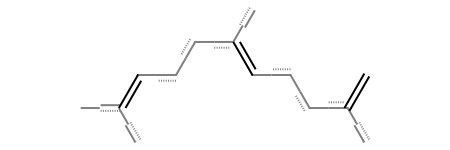

In [68]:
Chem.MolFromSmarts('[CH3][C]([CH3])=[CH][CH2][CH2][C]([CH3])=[CH][CH2][CH2][C]([CH3])=[CH2]')


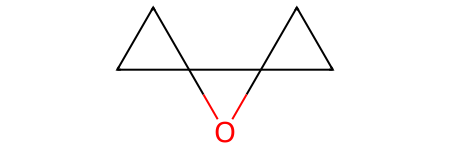

In [61]:
mol = dm.to_mol("C1CC12OC21CC1")
mol

In [ ]:
dm.to_mol(dm.to_smiles(mol, isomeric=False))

## Test molecules

In [7]:
list_atoms_not_allowed = {
    # Standard atoms
    'H', 'He', 'Li', 'Be', 'B', 'Ne',
    'Na', 'Mg', 'Al', 'Ar', 'K', 'Ca',
    'Sc', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn',
    'Ga', 'Ge', 'As', 'Se', 'Kr', 'Rb', 'Sr', 'Y', 'Zr',
    'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn',
    'Sb', 'Te', 'Xe', 'Cs', 'Ba', 'La', 'Ce', 'Pr', 'Nd',
    'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb',
    'Lu', 'Hf', 'Ta', 'W', 'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg',
    'Tl', 'Pb', 'Bi', 'Po', 'At', 'Rn', 'Fr', 'Ra', 'Ac', 'Th',
    'Pa', 'U', 'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm',
    'Md', 'No', 'Lr', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds',
    'Rg', 'Cn', 'Fl', 'Lv', 'Ts', 'Og', "Si"

}

tokenizer = re.compile(
        r'(\[[^\]]+\]|Br?|Cl?|N|O|S|P|F|I|B|C|b|c|n|o|s|p|\(|\)|\.|\=|\#|\-|\+|\\\\|\/|\:|\~|\@|\?|>>?|\*|\$|\%[0-9]{2}|[0-9])'
    )

smi = "[C;$(C(F)(F))]~[C;$(C(F)(F))]~[C;$(C(F)(F))]"
tokens = tokenizer.findall(smi)
print(tokens)
for atom in tokens:
    if atom.strip("[]") in list_atoms_not_allowed:
        print(atom)

['[C;$(C(F)(F))]', '~', '[C;$(C(F)(F))]', '~', '[C;$(C(F)(F))]']


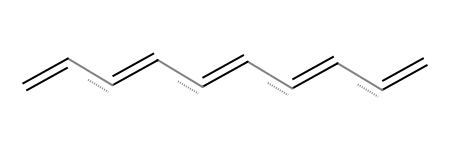

In [62]:
pattern = Chem.MolFromSmarts('[CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0][CD2;R0]=[CD2;R0]')
pattern

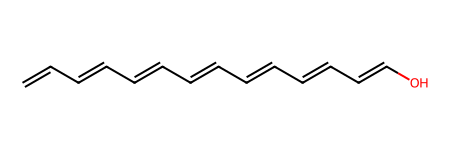

In [60]:
mol = dm.to_mol("C=CC=CC=CC=CC=CC=CC=CO")
mol

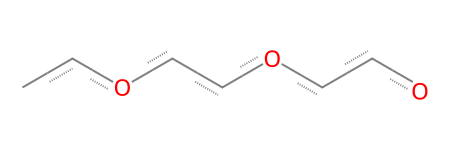

In [120]:
pattern = Chem.MolFromSmarts('CCOCCOCCO')
pattern

In [61]:
mol.HasSubstructMatch(pattern)

True

In [76]:
halogen = re.compile(r'Br|Cl|F|I')
halogen.findall(dm.to_smiles(mol))

['F', 'Cl', 'Br']

In [79]:
mol.HasSubstructMatch(pattern)

True

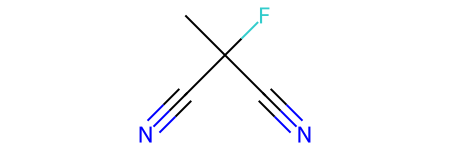

In [21]:
dm.to_mol('CC(F)(C#N)C#N')

In [67]:
mol = dm.to_mol('O=C=NC1=CC2C3=C(C=C1)C2=C(N=C=O)C=C3')
s1 = dm.to_smiles(mol, randomize=True)
s2 = dm.to_smiles(mol, randomize=True)
s3 = dm.to_smiles(mol, randomize=True)

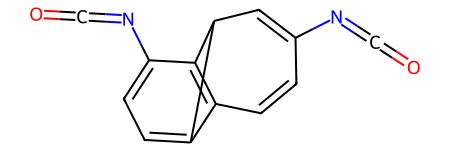

In [73]:
dm.to_mol(s2)

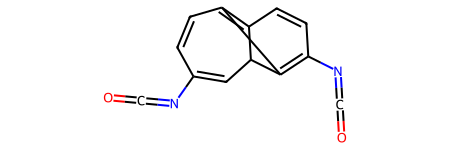

In [79]:
s = Chem.MolToSmiles(dm.to_mol(s1), canonical=True, isomericSmiles=False)
m = dm.to_mol(s)
m

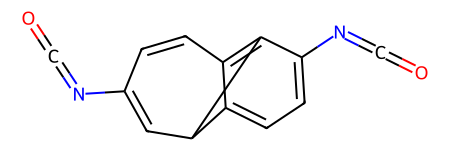

In [77]:
s = Chem.MolToSmiles(m, canonical=True, isomericSmiles=False)
m = dm.to_mol(s)
m

In [36]:
s

'O=C=NC1=CC2C3=C(C=C1)C2=C(N=C=O)C=C3'

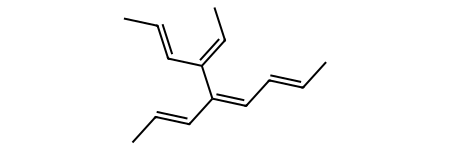

In [12]:
dm.to_mol(dm.to_smiles(m, canonical=True))

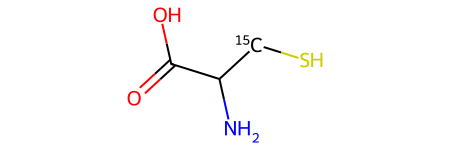

In [35]:
m = dm.to_mol("N[C@@H]([15CH2]S)C(=O)O")
Chem.RemoveStereochemistry(m)
m

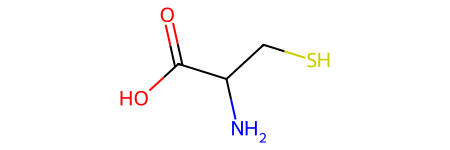

In [4]:
s = Chem.MolToSmiles(dm.to_mol("N[C@@H]([14CH2]S)C(=O)O"), canonical=True, isomericSmiles=False)
dm.to_mol(s)

In [16]:
import re
iso = r'\[(\d{1,3})([A-Z][a-z]?)[^\]]*\]'
if re.search(iso, "N[C@@H]1[C@@H]2CCO[C@H]12"):
    print("a")